# 18-1. 프로젝트: 자율주행 보조 시스템 만들기

먼저 주요 라이브러리 버전을 확인해봅시다.

In [1]:
import tensorflow as tf

print(tf.__version__)

2.6.0


In [2]:
import os, copy
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

DATA_PATH = os.getenv('HOME') + '/aiffel/object_detection/data'

In [3]:
(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir=DATA_PATH,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

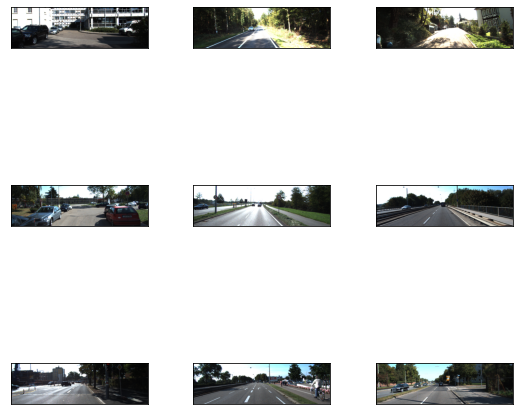

In [4]:
_ = tfds.show_examples(ds_train, ds_info)

In [5]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    full_name='kitti/3.2.0',
    description="""
    Kitti contains a suite of vision tasks built using an autonomous driving
    platform. The full benchmark contains many tasks such as stereo, optical flow,
    visual odometry, etc. This dataset contains the object detection dataset,
    including the monocular images and bounding boxes. The dataset contains 7481
    training images annotated with 3D bounding boxes. A full description of the
    annotations can be found in the readme of the object development kit readme on
    the Kitti homepage.
    """,
    homepage='http://www.cvlibs.net/datasets/kitti/',
    data_path='/aiffel/aiffel/object_detection/data/kitti/3.2.0',
    download_size=11.71 GiB,
    dataset_size=5.27 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
     

------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(9,), dtype=float32, numpy=
array([ 1.94, -1.79, -1.31, -1.77, -1.74, -1.48, -1.7 ,  1.63, -1.62],
      dtype=float32)>, 'bbox': <tf.Tensor: shape=(9, 4), dtype=float32, numpy=
array([[0.00266667, 0.02610306, 0.44632   , 0.34214172],
       [0.19072   , 0.57321256, 0.5009867 , 0.7091707 ],
       [0.17802666, 0.25784218, 0.48936   , 0.39426732],
       [0.30624   , 0.5499034 , 0.49776   , 0.6313768 ],
       [0.35048   , 0.533285  , 0.50189334, 0.59191626],
       [0.37288   , 0.39694846, 0.50405335, 0.44279388],
       [0.38906667, 0.5287842 , 0.53874665, 0.5755072 ],
       [0.41938666, 0.42517713, 0.50744   , 0.45710143],
       [0.44536   , 0.5109903 , 0.51162666, 0.533752  ]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(9, 3), dtype=float32, numpy=
array([[1.38, 1.53, 3.58],
       [1.49, 1.65, 4.06],
       [1.48, 1.58, 3.98],
       [1.44, 1.56, 3.76],
       [1.53,

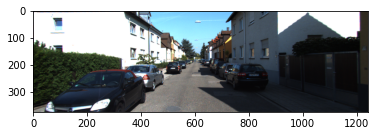

In [7]:
sample = ds_train.take(1)

for example in sample:  
    print('------Example------')
    print(list(example.keys()))
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
plt.imshow(img)
plt.show()

## 바운딩박스 시각화 함수 디버깅  : 아래 내용 참고

1. Bounding Box 좌표

    - object_bbox의 각 좌표(비율값):
    [y_min, x_min, y_max, x_max]

    예시 [[0.26469332, 0.55461353, 0.49154666, 0.65438807]]
    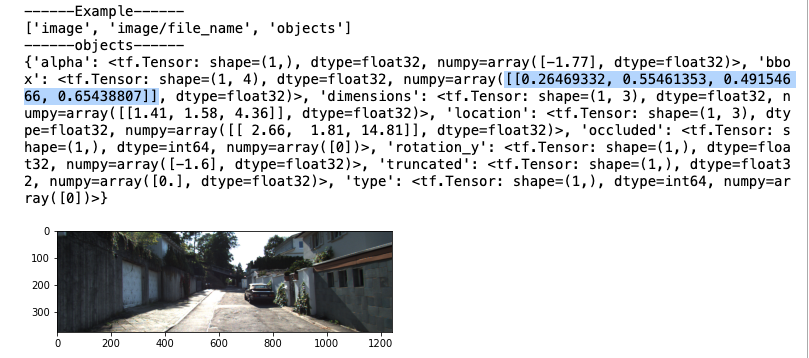
    


    tfds의 kitti BBox는 원점 (0,0) 이 이미지의 왼쪽 하단을 기준으로 계산 하는 것으로 보임
    1. y_min: Bounding Box의 상단(y_min) 좌표 (아래쪽 기준으로 정규화된 값)
    2. x_min: Bounding Box의 왼쪽(x_min) 좌표 (왼쪽에서 정규화된 값)
    3. y_max: Bounding Box의 하단(y_max) 좌표 (아래쪽 기준으로 정규화된 값)
    4. x_max: Bounding Box의 오른쪽(x_max) 좌표 (왼쪽에서 정규화된 값)

    Pillow 좌표계:
        • 원점(0,0)이 왼쪽 상단임
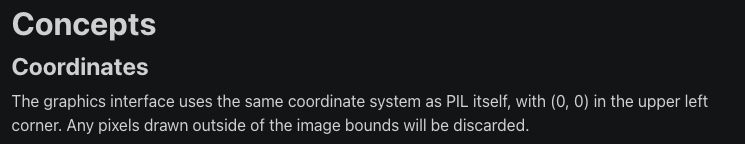  
    
- 기존 노드의 예시 코드 사용시 아래와 같이 좌하단, 우상단으로 박스를 그림
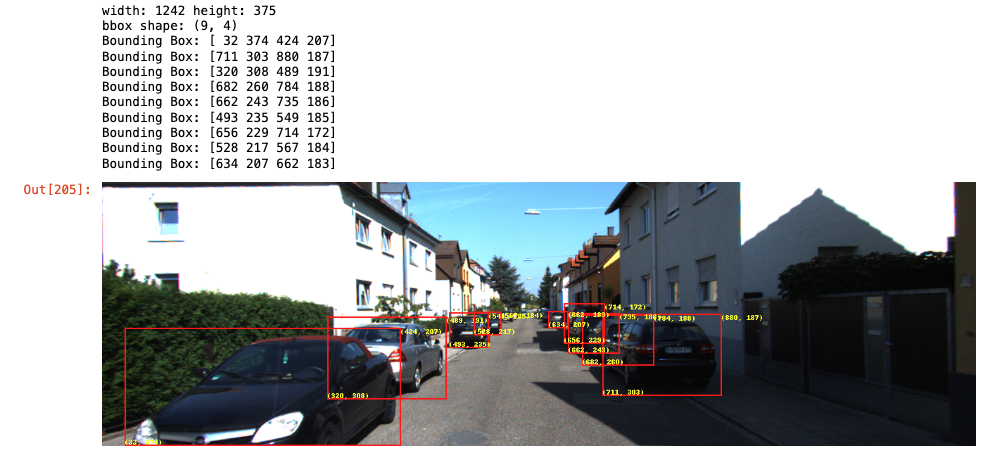
  
  
- x_min, y_min, x_max, y_max 가 되려면 아래와 같이 좌상단, 우하단으로 좌표가 찍혀야 함
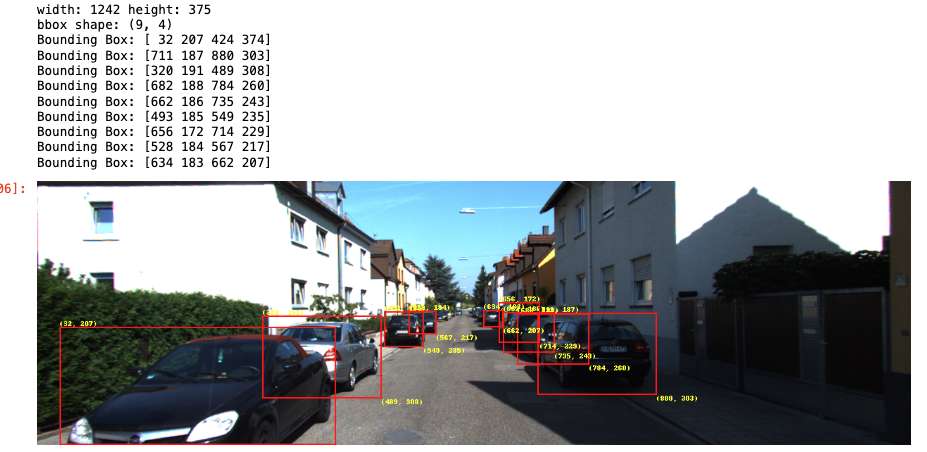
    
2. 최종 코드  
    y_min 과 y_max 의 index 가 바뀌어야 함
```python
x_min = (object_bbox[:,1] * width).astype(int)
y_min = (height - object_bbox[:,2] * height).astype(int)
x_max = (object_bbox[:,3] * width).astype(int)
y_max = (height - object_bbox[:,0] * height).astype(int)
```

    - 설명:  
    1.	x_min: 왼쪽에서부터 x_min 비율만큼 이동  
    2.	y_min: 이미지의 높이에서 y_max 비율만큼 빼기  
    3.	x_max: 왼쪽에서부터 x_max 비율만큼 이동    
    4.	y_max: 이미지의 높이에서 y_min 비율만큼 빼기

#### 참고 : ImageDraw.rectangle  
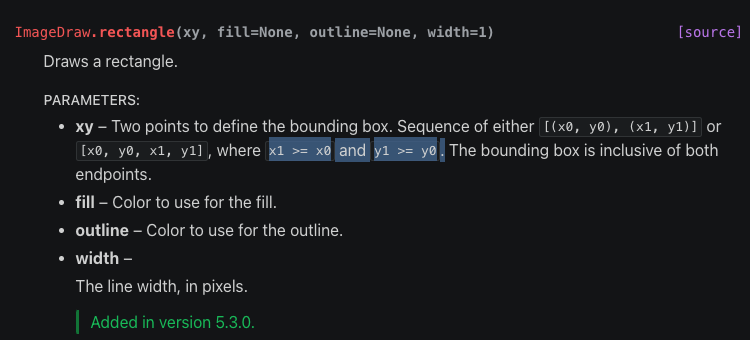

width: 1242 height: 375
bbox shape: (9, 4)
Bounding Box: [ 32 207 424 374]
Bounding Box: [711 187 880 303]
Bounding Box: [320 191 489 308]
Bounding Box: [682 188 784 260]
Bounding Box: [662 186 735 243]
Bounding Box: [493 185 549 235]
Bounding Box: [656 172 714 229]
Bounding Box: [528 184 567 217]
Bounding Box: [634 183 662 207]


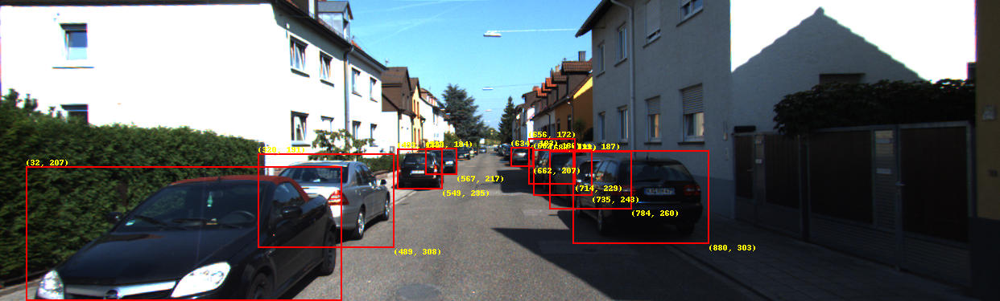

In [206]:
def visualize_bbox(input_image, object_bbox):
    """
    이미지 위에 바운딩 박스를 그리는 함수
    
    Parameters:
        input_image (PIL.Image): 입력 이미지
        object_bbox (numpy.ndarray): 바운딩 박스 좌표 배열 (y_min, x_min, y_max, x_max)
        
    Returns:
        PIL.Image: 바운딩 박스가 그려진 이미지
    """
    # 원본 이미지 복사
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 이미지 크기 확인
    width, height = input_image.size
    print('width:', width, 'height:', height)
    print('bbox shape:', object_bbox.shape)
    
    # 바운딩 박스 좌표 변환
    x_min = (object_bbox[:,1] * width).astype(int)
    y_min = (height - object_bbox[:,2] * height).astype(int)
    x_max = (object_bbox[:,3] * width).astype(int)
    y_max = (height - object_bbox[:,0] * height).astype(int)
    
    # y_min = (height - object_bbox[:,0] * height).astype(int)
    # y_max = (height - object_bbox[:,2] * height).astype(int)
    
    # 좌표 병합
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    
    # 바운딩 박스 그리기 및 좌표 표시
    for _rect in rects:
        print('Bounding Box:', _rect)
        # 바운딩 박스 그리기
        draw.rectangle(
            [(int(_rect[0]), int(_rect[1])), (int(_rect[2]), int(_rect[3]))], 
            outline=(255, 0, 0), 
            width=2
        )
        # 좌표 표시
        draw.text(
            (int(_rect[0]), int(_rect[1]) - 10),
            f"({int(_rect[0])}, {int(_rect[1])})",
            fill=(255, 255, 0)
        )
        draw.text(
            (int(_rect[2]), int(_rect[3])),
            f"({int(_rect[2])}, {int(_rect[3])})",
            fill=(255, 255, 0)
        )
    
#     # Matplotlib으로 표시
#     plt.figure(figsize=(12, 8))
#     plt.imshow(input_image)
#     plt.title('Bounding Boxes Visualization')
#     plt.show()
    
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

### 데이터 파이프 라인

In [9]:
def swap_xy(boxes):
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

In [10]:
def random_flip_horizontal(image, boxes):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
        
    return image, boxes

In [11]:
def resize_and_pad_image(image, training=True):

    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0
    
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio

In [12]:
def convert_to_xywh(boxes):
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )

In [13]:
def preprocess_data(sample):
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

### 인코딩

In [14]:
class AnchorBox:
    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)


In [15]:
def convert_to_corners(boxes):
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

In [16]:
class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()

### 모델 생성

In [17]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

In [18]:
def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

In [19]:
def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )


In [20]:
class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)


RetinaNet에서는 Focal Loss를 사용하는데요. Box Regression에는 사용하지 않고 Classification Loss를 계산하는데만 사용됩니다. Box Regression에는 Smooth L1 Loss를 사용했네요.

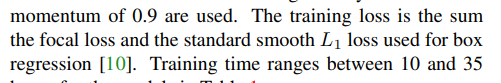

Smooth L1 Loss을 사용하는 Box Regression에는 delta를 기준으로 계산이 달라지고, Focal Loss를 사용하는 Classification에서는 alpha와 gamma를 사용해서 물체일 때와 배경일 때의 식이 달라지는 점에 주의하세요!

In [21]:
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

### 모델 학습

In [207]:
num_classes = 8
batch_size = 2

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

In [60]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)
optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

In [61]:
label_encoder = LabelEncoder()
(train_dataset, val_dataset), dataset_info = tfds.load(
    "kitti", split=["train", "validation"], with_info=True, data_dir=DATA_PATH
)

autotune = tf.data.AUTOTUNE
train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.prefetch(autotune)

val_dataset = val_dataset.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(label_encoder.encode_batch, num_parallel_calls=autotune)
val_dataset = val_dataset.prefetch(autotune)

In [63]:
# model_dir = os.getenv('HOME') + '/aiffel/object_detection/data/checkpoints/'
model_save_dir = os.getenv('HOME') + '/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints'
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_save_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    )
]

In [62]:
epochs = 20

model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=epochs,
    callbacks=callbacks_list
)

Epoch 1/20
3173/3173 [==============================] - 1636s 510ms/step - loss: 2.2531 - val_loss: 1.6908

Epoch 00001: saving model to /aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_1
Epoch 2/20
3173/3173 [==============================] - 1618s 510ms/step - loss: 1.0091 - val_loss: 1.2048

Epoch 00002: saving model to /aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_2
Epoch 3/20
3173/3173 [==============================] - 1619s 510ms/step - loss: 0.7465 - val_loss: 1.1530

Epoch 00003: saving model to /aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_3
Epoch 4/20
3173/3173 [==============================] - 1619s 510ms/step - loss: 0.5868 - val_loss: 1.0845

Epoch 00004: saving model to /aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_4
Epoch 5/20
3173/3173 [==============================] - 1619s 510ms/step - loss: 0.4861 - val_loss: 1.1367

Epoch 00005: saving model to /aiffel/aif

In [69]:
def get_best_val_loss_checkpoint(model_dir):
    """
    가장 낮은 val_loss 값을 가진 체크포인트 파일을 반환합니다.
    
    Parameters:
        model_dir (str): 체크포인트 디렉터리 경로
    
    Returns:
        str: 가장 낮은 val_loss 값을 가진 체크포인트 경로
    """
    checkpoint_path = os.path.join(model_dir, 'checkpoint')
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint file not found in {model_dir}")
    
    best_checkpoint = None
    best_val_loss = float('inf')
    
    # 체크포인트 파일 읽기
    with open(checkpoint_path, 'r') as f:
        lines = f.readlines()
    
    for line in lines:
        if 'model_checkpoint_path' in line:
            # 가장 최근 체크포인트 (일반적)
            continue
        if 'all_model_checkpoint_paths' in line:
            checkpoint = line.split('"')[1]
            val_loss_file = f"{checkpoint}.val_loss"
            
            if os.path.exists(val_loss_file):
                with open(val_loss_file, 'r') as lf:
                    val_loss = float(lf.read().strip())
                    print(f"Checkpoint: {checkpoint}, val_loss: {val_loss}")
                    if val_loss < best_val_loss:
                        best_val_loss = val_loss
                        best_checkpoint = checkpoint
    
    if best_checkpoint:
        print(f"Best checkpoint found: {best_checkpoint}, val_loss: {best_val_loss}")
        return best_checkpoint
    else:
        raise ValueError("No valid val_loss files found in checkpoints.")

In [70]:
def get_best_loss_checkpoint(model_dir):
    """
    가장 낮은 loss 값을 가진 체크포인트 파일을 반환합니다.
    
    Parameters:
        model_dir (str): 체크포인트 디렉터리 경로
    
    Returns:
        str: 가장 낮은 loss 값을 가진 체크포인트 경로
    """
    checkpoint_path = os.path.join(model_dir, 'checkpoint')
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint file not found in {model_dir}")
    
    best_checkpoint = None
    best_loss = float('inf')
    
    # 체크포인트 파일 읽기
    with open(checkpoint_path, 'r') as f:
        lines = f.readlines()
    
    for line in lines:
        if 'model_checkpoint_path' in line:
            # 가장 최근 체크포인트 (일반적)
            continue
        if 'all_model_checkpoint_paths' in line:
            checkpoint = line.split('"')[1]
            meta_file = f"{checkpoint}.index"
            loss_file = f"{checkpoint}.loss"
            
            if os.path.exists(loss_file):
                with open(loss_file, 'r') as lf:
                    loss = float(lf.read().strip())
                    print(f"Checkpoint: {checkpoint}, Loss: {loss}")
                    if loss < best_loss:
                        best_loss = loss
                        best_checkpoint = checkpoint
    
    if best_checkpoint:
        print(f"Best checkpoint found: {best_checkpoint}, Loss: {best_loss}")
        return best_checkpoint
    else:
        raise ValueError("No valid loss files found in checkpoints.")

In [71]:
# # 가장 낮은 Loss의 체크포인트 찾기
# best_checkpoint = get_best_loss_checkpoint(model_dir)

# # 모델에 체크포인트 로드
# if best_checkpoint:
#     model.load_weights(best_checkpoint)
#     print(f"Best loss checkpoint loaded: {best_checkpoint}")

In [72]:
# # 가장 낮은 val_loss 체크포인트 찾기
# best_checkpoint = get_best_val_loss_checkpoint(model_dir)

# # 모델에 체크포인트 로드
# if best_checkpoint:
#     model.load_weights(best_checkpoint)
#     print(f"Best val_loss checkpoint loaded: {best_checkpoint}")

### 1차 실험 : 학습된 모델 load

In [186]:
model_dir = os.getenv('HOME') + '/aiffel/object_detection/data/checkpoints/'
latest_checkpoint = tf.train.latest_checkpoint(model_dir)
model.load_weights(latest_checkpoint)

### 2차 실험 : 20 epoch 중 가장 낮은 val_loss 의 weight 사용
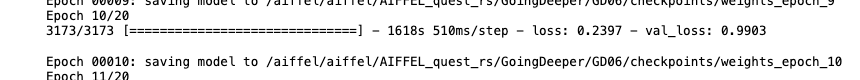

In [208]:
# 지정된 체크포인트 경로 설정
checkpoint_path = '/aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_10'

# 체크포인트 파일 확인 및 가중치 불러오기
if os.path.exists(checkpoint_path + '.index') and os.path.exists(checkpoint_path + '.data-00000-of-00001'):
    print("Checkpoint files exist. Proceeding to load weights.")
    try:
        model.load_weights(checkpoint_path)
        print(f"Successfully loaded checkpoint from: {checkpoint_path}")
    except Exception as e:
        print(f"Failed to load checkpoint: {e}")
else:
    raise FileNotFoundError(f"Checkpoint files not found at: {checkpoint_path}")

Checkpoint files exist. Proceeding to load weights.
Successfully loaded checkpoint from: /aiffel/aiffel/AIFFEL_quest_rs/GoingDeeper/GD06/checkpoints/weights_epoch_10


## tf.image.combined_non_max_suppression 함수 정리

```python
tf.image.combined_non_max_suppression(
    boxes,
    scores,
    max_output_size_per_class,
    max_total_size,
    iou_threshold=0.5,
    score_threshold=float('-inf'),
    pad_per_class=False,
    clip_boxes=True,
    name=None
)
```
#### 매개변수
    • boxes: [batch_size, num_boxes, q, 4] 형태의 4차원 텐서로, 각 경계 상자의 좌표를 나타냅니다. q가 1이면 모든 클래스에 동일한 상자를 사용하고, q가 클래스 수와 같으면 클래스별 상자를 사용합니다.
    • scores: [batch_size, num_boxes, num_classes] 형태의 3차원 텐서로, 각 상자에 대한 점수를 나타냅니다.
    • max_output_size_per_class: 클래스별로 선택할 최대 상자 수를 지정하는 정수 스칼라입니다.
    • max_total_size: 모든 클래스에 걸쳐 유지할 최대 상자 수를 지정하는 정수 스칼라입니다.
    • iou_threshold: 상자 간의 **교차 영역 비율(IoU, Intersection over Union)**이 이 값 이상이면 중복으로 간주하여 제거합니다. 기본값은 0.5입니다.
    • score_threshold: 이 점수 이하의 상자는 제거합니다. 기본값은 -inf로, 모든 상자를 고려합니다.
    • pad_per_class: True로 설정하면, 클래스별로 패딩하여 출력의 크기를 max_output_size_per_class * num_classes로 만듭니다. False로 설정하면, 전체 출력 크기를 max_total_size로 맞춥니다. 기본값은 False입니다.
    • clip_boxes: True로 설정하면, 출력된 상자의 좌표를 [0, 1] 범위로 자릅니다. 기본값은 True입니다.
    • name: 연산의 이름을 지정할 수 있습니다. 선택 사항입니다.

#### 반환값
    • nmsed_boxes: 비최대 억제 후 남은 상자들을 포함하는 [batch_size, max_detections, 4] 형태의 float32 텐서입니다.
    • nmsed_scores: 선택된 상자들의 점수를 포함하는 [batch_size, max_detections] 형태의 float32 텐서입니다.
    • nmsed_classes: 선택된 상자들의 클래스를 포함하는 [batch_size, max_detections] 형태의 float32 텐서입니다.
    • valid_detections: 배치 항목별로 유효한 감지 수를 나타내는 [batch_size] 형태의 int32 텐서입니다.
    
#### 사용예시
```python
# 예시 데이터
boxes = tf.random.uniform(shape=[1, 10, 1, 4])
scores = tf.random.uniform(shape=[1, 10, 3])

# 비최대 억제 수행
nmsed_boxes, nmsed_scores, nmsed_classes, valid_detections = tf.image.combined_non_max_suppression(
    boxes=boxes,
    scores=scores,
    max_output_size_per_class=5,
    max_total_size=5,
    iou_threshold=0.5,
    score_threshold=0.5
)

print("선택된 상자들:", nmsed_boxes)
print("선택된 점수들:", nmsed_scores)
print("선택된 클래스들:", nmsed_classes)
print("유효한 감지 수:", valid_detections)
```

In [189]:
class DecodePredictions(tf.keras.layers.Layer):

    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            box_variance, dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )

In [213]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

In [300]:
car = ['Car', 'Van', 'Truck']
people = ['Pedestrian', 'Person_sitting', 'Cyclist']

In [301]:
def visualize_detections(
    image, boxes, classes, scores, figsize=(12, 4), linewidth=1, color=[1, 1, 1]
):
    image = np.array(image, dtype=np.uint8)

    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):

        color=[1, 1, 1]
        if _cls in car:
            color=[0,1,1]
        elif _cls in people:
            color = [1,1,0]

        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        origin_x, origin_y = x1, image.shape[0] - y2 # matplitlib에서 Rectangle와 text를 그릴 때는 좌하단이 원점이고 위로 갈 수록 y값이 커집니다
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [origin_x, origin_y], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            origin_x,
            origin_y,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax


In [302]:
def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, training=False)
    image = tf.keras.applications.resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0), ratio

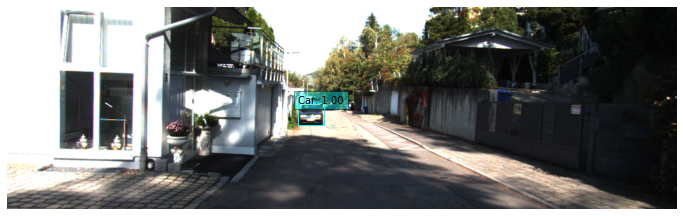

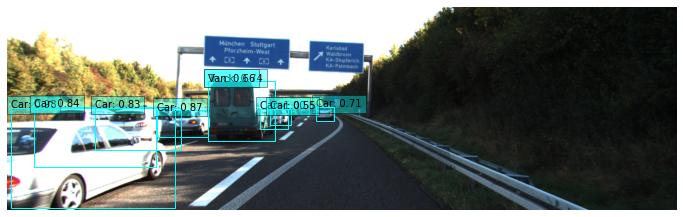

In [303]:
test_dataset = tfds.load("kitti", split="test", data_dir=DATA_PATH)
int2str = dataset_info.features["objects"]["type"].int2str

for sample in test_dataset.take(2):
    image = tf.cast(sample["image"], dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
        int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )

### 1. 자율주행 시스템 만들기
---
위에서 만든 모델을 통해 아래의 조건을 만족하는 함수를 만들어 주세요.

- 입력으로 이미지 경로를 받습니다.
- 정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환합니다.
- 조건은 다음과 같습니다.
    - 사람이 한 명 이상 있는 경우
    - 차량의 크기(width or height)가 300px이상인 경우

### Class 라벨 확인
Label 0: Car  
Label 1: Van  
Label 2: Truck  
Label 3: Pedestrian  
Label 4: Person_sitting  
Label 5: Cyclist  
Label 6: Tram  
Label 7: Misc  
Label 8: DontCare  

In [328]:
# 사람 관련 라벨
# Cyclist 도 사람으로 봐야 하나?
# go_3.png 이미지에 Cyclist 있지만 lable 이 Go 이기 때문에 사람에서 제외 시킴
HUMAN_LABELS = [3, 4] # , 5]

In [329]:
# 차량 관련 라벨
VEHICLE_LABELS = [0, 1, 2]

In [330]:
def load_image_from_path(img_path):
    """이미지 경로에서 이미지를 로드하고 Tensor로 변환"""
    image = Image.open(img_path).convert("RGB")
    image = np.array(image, dtype=np.float32)
    return tf.convert_to_tensor(image, dtype=tf.float32)

In [331]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/data/stop_1.png'

In [332]:
def self_drive_assist(img_path, size_limit=300, DEBUG=False):
    """
    self_drive_assist
    
    Parameters:
        img_path (str): 이미지 경로
        size_limit (int): 차량 너비 또는 높이의 임계값 (기본값 300px)
        DEBUG (int): 디버깅 메시지 출력 여부 (1: 출력, 0: 비활성화)
    
    Returns:
        str: 'Stop' 또는 'Go'
    """
    # 이미지 로드 및 전처리
    image = load_image_from_path(img_path)
    input_image, ratio = prepare_image(image)
    
    # 객체 감지 예측
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    boxes = detections.nmsed_boxes[0][:num_detections] / ratio
    scores = detections.nmsed_scores[0][:num_detections]
    classes = detections.nmsed_classes[0][:num_detections]
    
    # 클래스 이름 매핑
    class_names = [
        int2str(int(x)) for x in classes
    ]
    
    # 객체 탐지 결과 시각화
    visualize_detections(
        image,
        boxes,
        class_names,
        scores,
    )
    
    if DEBUG:
        print("[DEBUG] Resize Ratio:", ratio)
        print("[DEBUG] Original Image Shape:", image.shape)
        print("[DEBUG] Input Image Shape:", input_image.shape)
    
    if DEBUG:
        # print("[DEBUG] Number of Boxes:", len(detections.nmsed_boxes[0]))
        print(f"[DEBUG] Image Dimensions: Width={image.shape[1]}, Height={image.shape[0]}")
    
    # Bounding Box 좌표 변환 및 조건 검사
    img_height, img_width = image.shape[:2]
    
    for box, score, label in zip(boxes, scores, classes):
        if score < 0.3:
            if DEBUG:
                print(f"[DEBUG] Detection skipped low confidence: Score={score:.2f}, Label={label}")
            continue

        if DEBUG:
            print(f"[DEBUG] Box: {box}")

        y_min, x_min, y_max, x_max = box
        width = abs(x_max - x_min)
        height = abs(y_max - y_min)
        
        # if DEBUG:
        #    print(f"[DEBUG] Object Dimensions: Width={width:.2f}px, Height={height:.2f}px")

        # 사람 감지
        if label in HUMAN_LABELS:
            if DEBUG:
                print(f"[DEBUG] Detected: Human (Label: {label}), Confidence: {score:.2f}")
            return 'Stop'

        # 차량 감지
        if label in VEHICLE_LABELS and (width >= size_limit or height >= size_limit):
            if DEBUG:
                print(f"[DEBUG] Detected: Vehicle (Label: {label}), Confidence: {score:.2f} size: Width={width:.2f}px, Height={height:.2f}px")
            return 'Stop'
        
    # 조건에 해당하지 않는 경우
    if DEBUG:
        print("[DEBUG] No objects matched the Stop conditions.")
    return 'Go'

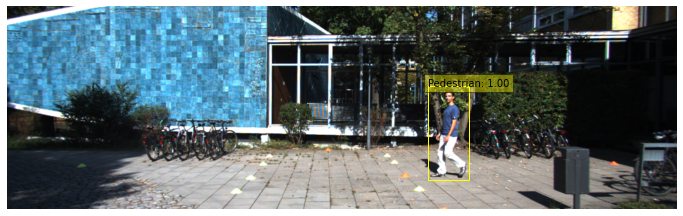

[DEBUG] Resize Ratio: tf.Tensor(1.0890523, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (370, 1224, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1224, Height=370
[DEBUG] Box: [768.5267    52.498314 843.49274  225.51213 ]
[DEBUG] Detected: Human (Label: 3.0), Confidence: 1.00
Stop


In [333]:
print(self_drive_assist(img_path, DEBUG=True))

### 2. 자율주행 시스템 평가하기
---
아래 test_system() 를 통해서 위에서 만든 함수를 평가해봅시다. 10장에 대해 Go와 Stop을 맞게 반환하는지 확인하고 100점 만점으로 평가해줍니다.

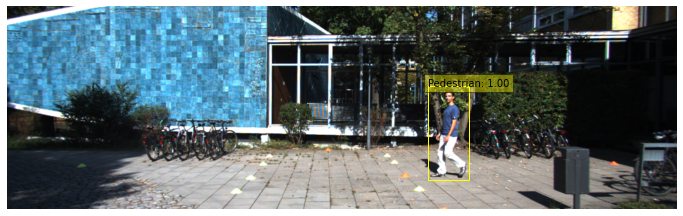

[DEBUG] Resize Ratio: tf.Tensor(1.0890523, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (370, 1224, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1224, Height=370
[DEBUG] Box: [768.5267    52.498314 843.49274  225.51213 ]
[DEBUG] Detected: Human (Label: 3.0), Confidence: 1.00


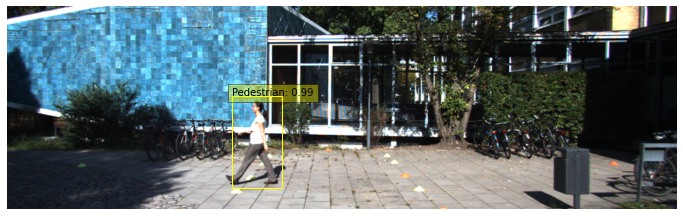

[DEBUG] Resize Ratio: tf.Tensor(1.0890523, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (370, 1224, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1224, Height=370
[DEBUG] Box: [411.2155    38.562782 501.4408   207.4089  ]
[DEBUG] Detected: Human (Label: 3.0), Confidence: 0.99


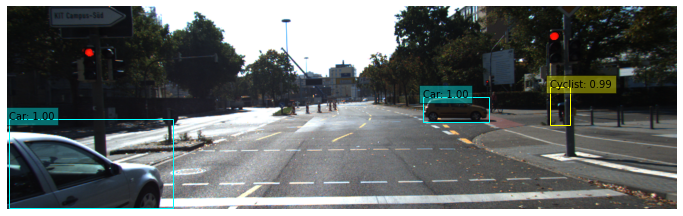

[DEBUG] Resize Ratio: tf.Tensor(1.0890523, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (370, 1224, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1224, Height=370
[DEBUG] Box: [758.6676 160.0534 880.8196 205.411 ]
[DEBUG] Box: [  2.7126133   1.1376989 303.05347   164.46112  ]
[DEBUG] Detected: Vehicle (Label: 0.0), Confidence: 1.00 size: Width=163.32px, Height=300.34px


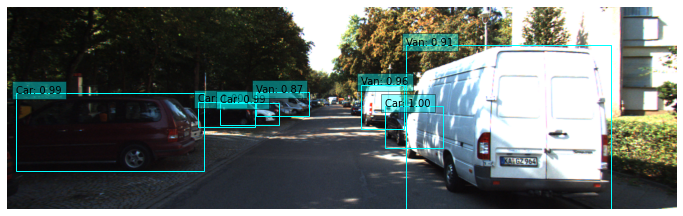

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [352.78677 152.19241 459.2679  198.84122]
[DEBUG] Box: [700.3569  113.5325  808.56726 190.57349]
[DEBUG] Box: [ 16.095581  70.52664  364.49207  214.93585 ]
[DEBUG] Detected: Vehicle (Label: 0.0), Confidence: 0.99 size: Width=144.41px, Height=348.40px


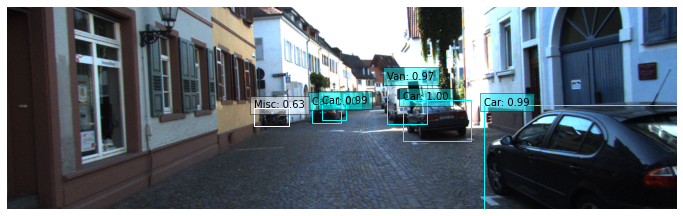

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [734.3993  126.18717 859.51044 203.07484]
[DEBUG] Box: [565.0669  158.76955 617.9453  193.96494]
[DEBUG] Box: [8.8388727e+02 3.8542602e-02 1.2443127e+03 1.9216818e+02]
[DEBUG] Detected: Vehicle (Label: 0.0), Confidence: 0.99 size: Width=192.13px, Height=360.43px


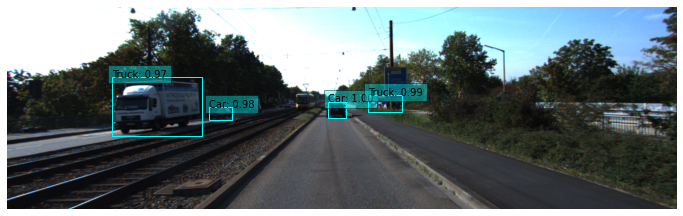

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [593.8337  169.3766  627.1281  199.47444]
[DEBUG] Box: [668.26483 180.57649 731.2822  211.69682]
[DEBUG] Box: [373.32874 164.84904 416.74692 188.56248]
[DEBUG] Box: [193.42467 134.94385 360.3446  244.51183]
[DEBUG] No objects matched the Stop conditions.


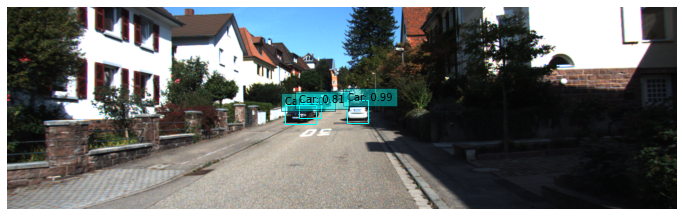

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [515.31305 158.70973 572.26044 193.8757 ]
[DEBUG] Box: [629.9827  159.98094 669.5355  201.63797]
[DEBUG] Box: [540.97034 169.68478 581.7201  196.96745]
[DEBUG] No objects matched the Stop conditions.


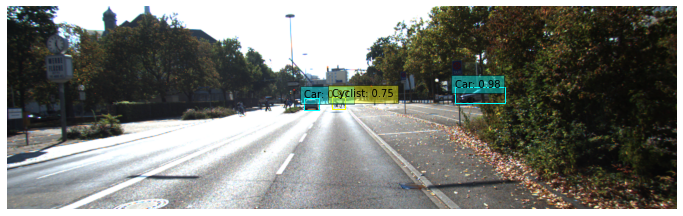

[DEBUG] Resize Ratio: tf.Tensor(1.0890523, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (370, 1224, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1224, Height=370
[DEBUG] Box: [817.31757 193.02684 909.38605 223.30173]
[DEBUG] Box: [542.0859  181.20178 570.0491  203.6286 ]
[DEBUG] Box: [593.0592  183.05565 616.6457  205.48581]
[DEBUG] No objects matched the Stop conditions.


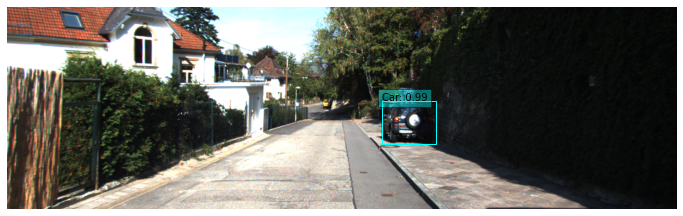

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [693.86725  120.807076 795.1708   201.31175 ]
[DEBUG] No objects matched the Stop conditions.


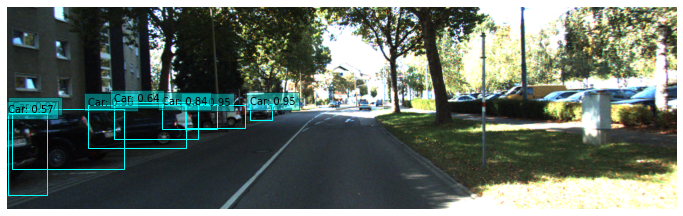

[DEBUG] Resize Ratio: tf.Tensor(1.0732689, shape=(), dtype=float32)
[DEBUG] Original Image Shape: (375, 1242, 3)
[DEBUG] Input Image Shape: (1, 512, 1408, 3)
[DEBUG] Image Dimensions: Width=1242, Height=375
[DEBUG] Box: [150.26456 113.95568 330.63617 192.51736]
[DEBUG] Box: [  8.600652  73.52695  216.15533  185.11946 ]
[DEBUG] Box: [449.56433 164.8676  490.39716 194.68518]
[DEBUG] Box: [328.54004 149.87712 439.70908 192.29741]
[DEBUG] Box: [285.91815 148.06413 387.87628 194.22342]
[DEBUG] Box: [198.12038 130.3216  353.7393  199.34377]
[DEBUG] Box: [  1.6311476  25.781631   73.71369   179.05774  ]
[DEBUG] No objects matched the Stop conditions.
100점입니다.


In [334]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection/data'
    score = 0
    test_set=[
        ("stop_1.png", "Stop"),
        ("stop_2.png", "Stop"),
        ("stop_3.png", "Stop"),
        ("stop_4.png", "Stop"),
        ("stop_5.png", "Stop"),
        ("go_1.png", "Go"),
        ("go_2.png", "Go"),
        ("go_3.png", "Go"),
        ("go_4.png", "Go"),
        ("go_5.png", "Go"),
    ]
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        # pred = func(image_path)
        pred = func(image_path, DEBUG=True)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist)

## 실험 결과 요약

### 1차 실험 결과
- stop_1.png 이미지에 대한 confidence 가 0.6 이 나왔음
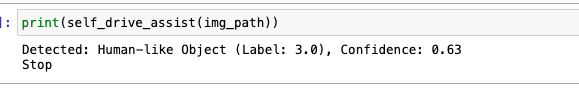  

- 자율주행 시스템 평가하기 10장에 대한 점수 90점
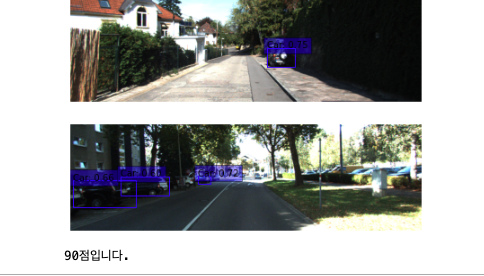

- Debug 코드로 검토한 결과 아래 이미지의 흰 밴을 검출 하지 못함
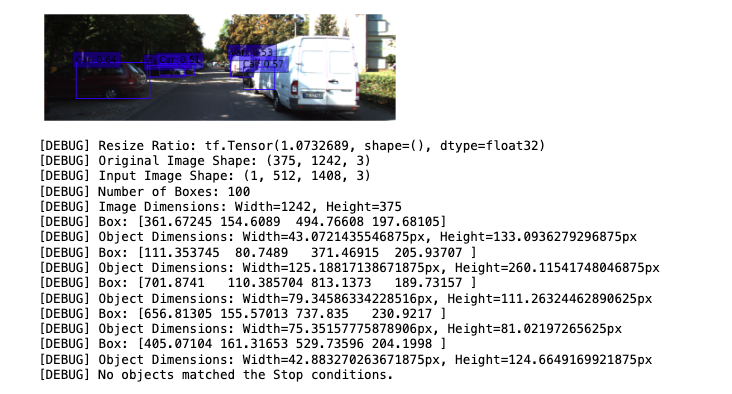

### 2차 실험 결과
- 20 epoch 학습 후 추론한 결과 stop_1.png 의 confidence 가 0.63 -> 1.0 으로 성능 향상을 보임
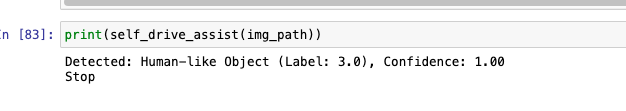

### 3차 실험 결과
- DEBUG 옵션 추가하여 세부 정보 확인 할 수 있도록 수정하였음
- 사람, 차량, 그 외 바운딩 박스 색 구분하여 시각화 하였음
- 자율주행 시스템 평가하기 10장에 대해 100점 확인 됨
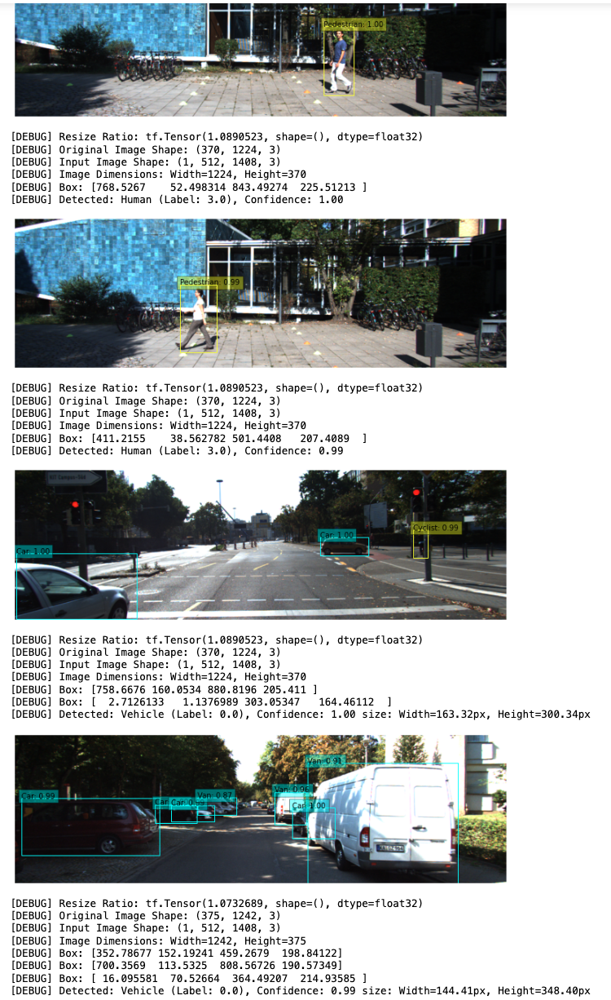
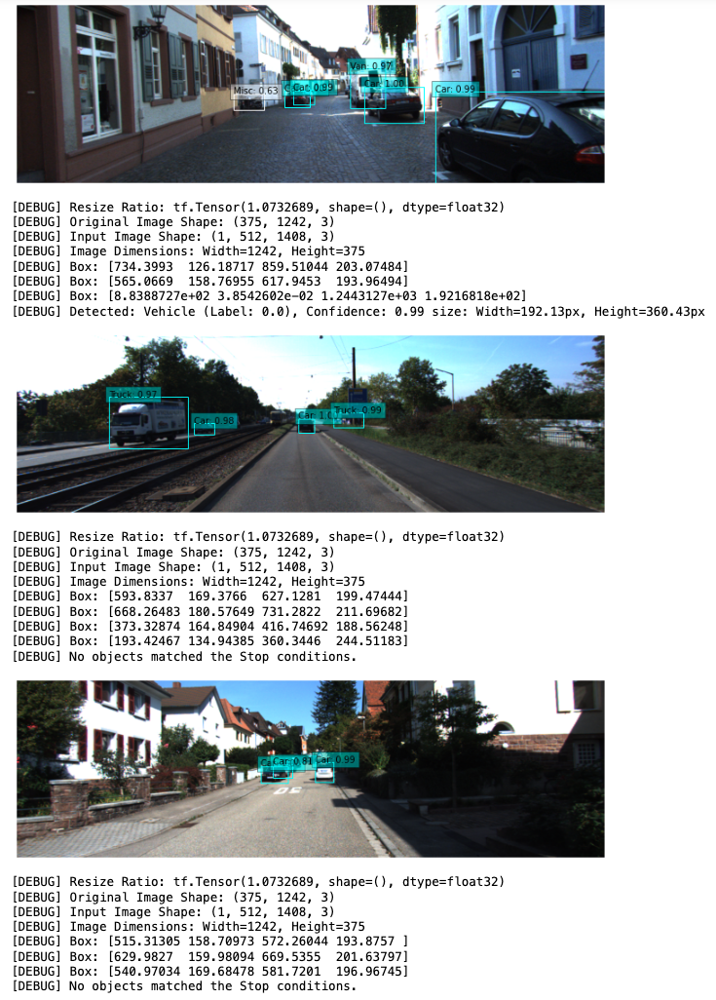
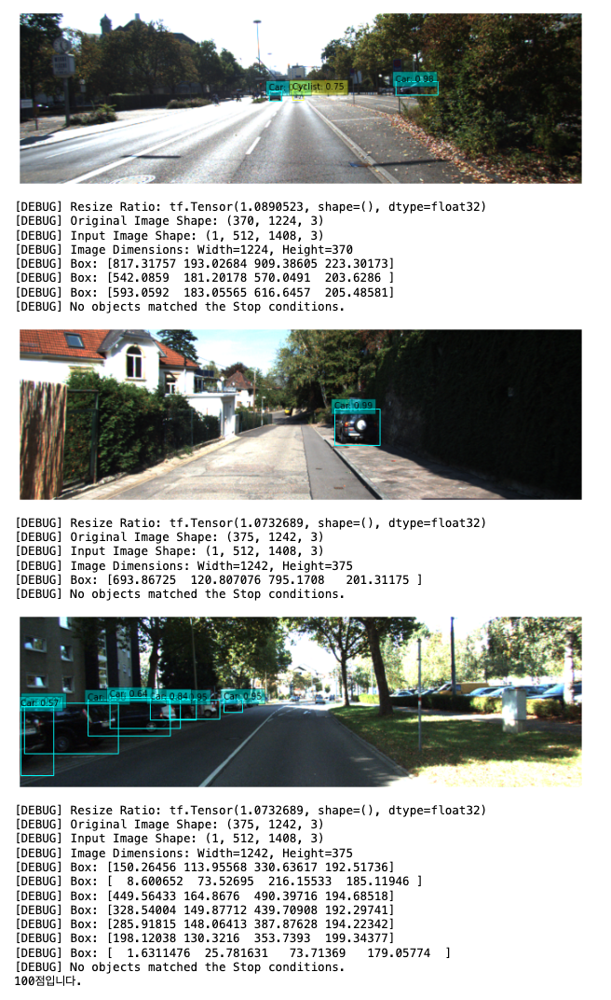

### 4차 실험 결과
- Cyclist 를 사람 조건에 추가할 경우 아래 이미지(go_3.png)에서 조건에 걸리게 되어 Stop 이 되나 정답은 Go 이기 때문에 점수가 90점으로 나옴
- Cyclist 의 크기 조건을 추가 하면 정답을 맞출 수 있겠지만 이번 프로젝트 조건에는 사람의 크기는 없으므로 제외 시킴
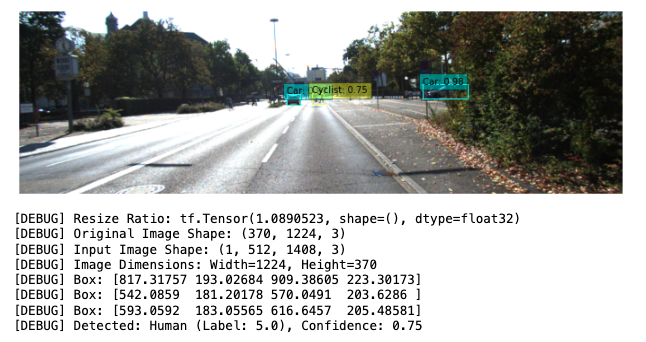
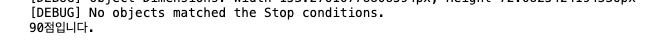

- 아래 이미지에서는 Cyclist 가 있지만 정답 자체가 Stop 이기 때문에 점수에는 해당 없음
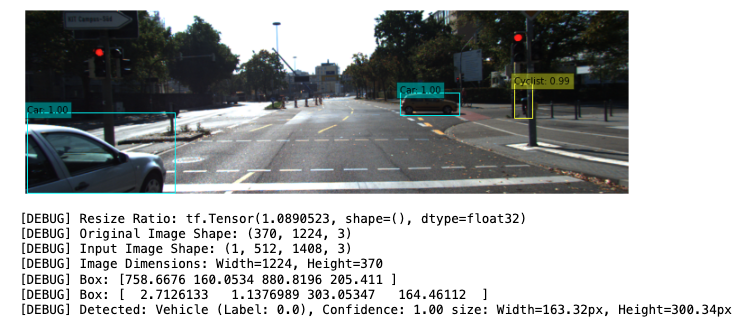

### 회고
- 좌표계가 너무 헷갈린다. 좌표계랑 바운딩박스 형식도 하나로 표준화가 되었으면 좋겠다.
- tfds의 kitti BBox 원점 (0,0) 이 왼쪽 하단을 기준으로 되어 있는지 다시 한번 확인이 필요하다.
- 내가 디버깅한 내용이 맞다면 노드의 코드 수정이 필요함(바운딩박스를 그리는 것은 이상이 없으나 y_min, y_max 값이 반대로 설정 됨)
- 3차 실험에서 디버깅 log를 보면서 어느 정도 코드에 대해 이해를 할 수 있었다.
- confidence score 는 10 epoch 정도에서 성능이 아주 잘 나오는 것을 볼 수 있다.
- 다만 이걸 가지고 rule base 로 주행조건을 판단 하기에는 변수가 너무 많다. (사이클이 있는데 앞에 있나? 옆에 있나? 등등...)
    - 차량의 CAN 데이터(velocity, 핸들 각도 등등..), 센서 데이터 등을 같이 고려해도 rule base 는 if elif 조건을 너무 많이 봐야 된다.
- 이번 노드를 통해 자율 주행 관련 하여 좀 더 많은 프로젝트를 경험 해 보고 싶다.

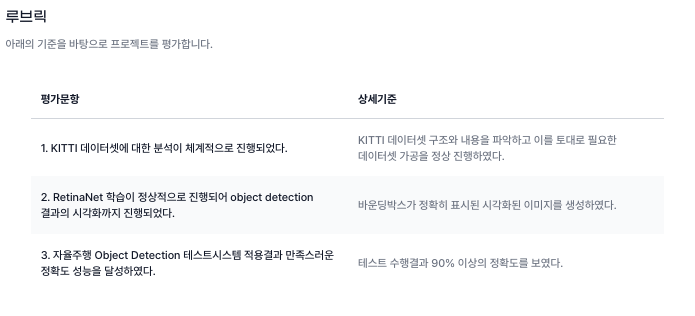